In [1]:
%matplotlib inline

import sys
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
os.environ["TF_CPP_MIN_LOG_LEVEL"]= "2"
sys.path.append("../models/slim")
# Tensorflow
import tensorflow as tf
slim = tf.contrib.slim
from nets import inception
from preprocessing import inception_preprocessing
from datasets import imagenet
# Third-party
import matplotlib.pyplot as plt
from skimage.segmentation import mark_boundaries
import numpy as np
import time
# LIME
from lime import lime_image

In [2]:
session = tf.Session()
image_size = inception.inception_v3.default_image_size

In [3]:
def transform_img_fn(path_list):
    out = []
    for f in path_list:
        image_raw = tf.image.decode_jpeg(open(f).read(), channels=3)
        image = inception_preprocessing.preprocess_image(image_raw, image_size, image_size, is_training=False)
        out.append(image)
    return session.run([out])[0]

In [4]:
names = imagenet.create_readable_names_for_imagenet_labels()
processed_images = tf.placeholder(tf.float32, shape=(None, 299, 299, 3))

In [5]:
with slim.arg_scope(inception.inception_v3_arg_scope()):
    logits, _ = inception.inception_v3(processed_images, num_classes=1001, is_training=False)
probabilities = tf.nn.softmax(logits)

In [6]:
checkpoints_dir = "../models/slim/pretrained"
init_fn = slim.assign_from_checkpoint_fn(
    os.path.join(checkpoints_dir, "inception_v3.ckpt"),
    slim.get_model_variables("InceptionV3"))
init_fn(session)

In [7]:
def predict_fn(images):
    return session.run(probabilities, feed_dict={processed_images: images})

# Base Classifier and Lime explanations for top 5 Classes

../data/image_input/01.jpg
241.472265959
../data/image_input/02.jpg
231.713949919
../data/image_input/03.jpg
231.864959955
../data/image_input/04.jpg
232.268046141


/usr/lib/python2.7/dist-packages/matplotlib/pyplot.py:516: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


../data/image_input/05.jpg
235.92939496
../data/image_input/06.jpg
237.756867886
../data/image_input/07.jpg
236.278002977
../data/image_input/08.jpg
236.759265184
../data/image_input/09.jpg
249.574759007
../data/image_input/10.jpg
250.531440973
../data/image_input/12.jpg
249.587038994
../data/image_input/13.jpg
252.406756878
../data/image_input/14.jpg
251.307022095


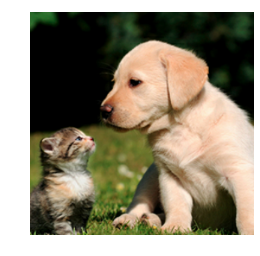

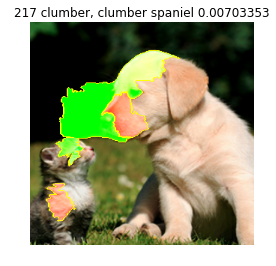

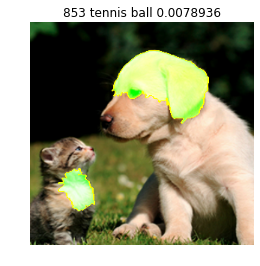

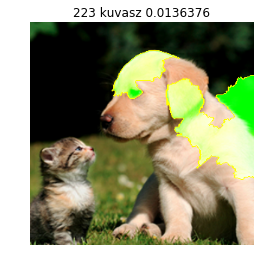

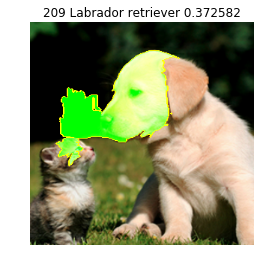

...

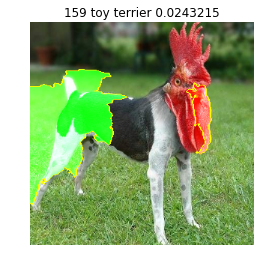

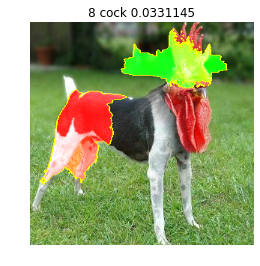

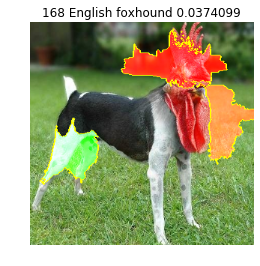

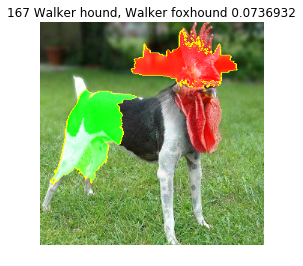

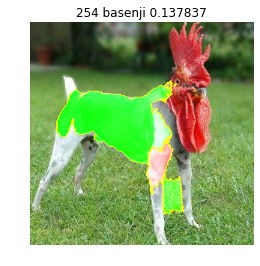

In [148]:
indir = '../data/image_input/'

for infile in os.listdir(indir):
    if filename.endswith(".jpg"):
        infile_path = os.path.join(indir, infile)
        print(infile_path)
        
        # Base Classifier
        images = transform_img_fn([infile_path])
        # I"m dividing by 2 and adding 0.5 because of how this Inception represents images
        plt.figure()
        plt.axis('off')
        plt.imshow(images[0] / 2 + 0.5)
        preds = predict_fn(images)

        # Lime Explainer
        image = images[0]
        tmp = time.time()
        explainer = lime_image.LimeImageExplainer()
        explanation = explainer.explain_instance(image, predict_fn, top_labels=5, hide_color=0, num_samples=1000)
        print time.time() - tmp

        # Explanations for top 5 classes
        for x in preds.argsort()[0][-5:]:
            plt.figure()
            plt.axis('off')
            temp, mask = explanation.get_image_and_mask(x, positive_only=False, num_features=5, hide_rest=False)
            plt.imshow(mark_boundaries(temp / 2 + 0.5, mask))
            plt.title(str(x) + str(' ') + str(names[x]) + str(' ') + str(preds[0,x]))